# Water Quality Explanatory Data Analysis

* Bivariate and multivariate data analysis
* Correlation analysis
* Preprocessing: missing value, train-test split and normalization
* Modelling: Decision Tree and Random Forest Classifiers
* Visualize Decision Tree
* Random Forest Hyperparameter Tuning

## Introduction
* Access to safe drinking-water is essential to health, a basic human right and a component of effective policy for health protection. This is important as a health and development issue at a national, regional and local level. In some regions, it has been shown that investments in water supply and sanitation can yield a net economic benefit, since the reductions in adverse health effects and health care costs outweigh the costs of undertaking the interventions.
* Drinking water and staying hydrated is associated with a reduced incidence of urinary tract infections (UTIs), lower blood pressure and heart disease. Therefore, drinking water is essential for good heart health.
* Water is the most important nutrient for the body. It has many benefits for your health and helps to protect you from illness and disease. Water is also an essential part of a healthy lifestyle.

## Python Libraries

In [5]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import missingno as msno
import os

# ML
from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, confusion_matrix
from sklearn import tree

## About Dataset
The water_potability.csv file contains water quality metrics for 3276 different water bodies.
1. **pH value:**
PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards.
2. **Hardness:**
Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium.
3. **Solids (Total dissolved solids - TDS):**
Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized. Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.
4. **Chloramines:**
Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.
5. **Sulfate:**
Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations.
6. **Conductivity:**
Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. According to WHO standards, EC value should not exceeded 400 μS/cm.
7. **Organic_carbon:**
Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water. According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment.
8. **Trihalomethanes:**
THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated. THM levels up to 80 ppm is considered safe in drinking water.
9. **Turbidity:**
The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter. The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU.
10. **Potability:**
Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.

## Read and Analyse Data

In [8]:
main_df = pd.read_csv(r"datasets\water_potability.csv")
df = main_df.copy()

In [9]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [10]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [12]:
df.nunique()

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [13]:
df.isnull()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,True,False,False,False,False,False,False,False,False,False
1,False,False,False,False,True,False,False,False,False,False
2,False,False,False,False,True,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
3271,False,False,False,False,False,False,False,False,False,False
3272,False,False,False,False,True,False,False,True,False,False
3273,False,False,False,False,True,False,False,False,False,False
3274,False,False,False,False,True,False,False,False,False,False


In [14]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [15]:
df.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

<Axes: >

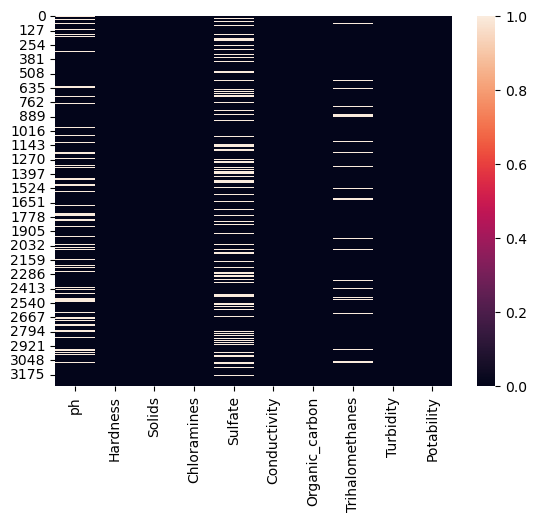

In [16]:
sns.heatmap(df.isnull())

## Dependent Variable Analysis 

In [18]:
dv = pd.DataFrame(df['Potability'].value_counts())
dv

,count
Potability,
0,1998
1,1278


In [19]:
fig = px.pie(dv, values = "count", names = ["Not Potable", "Potable"],
             labels = {'label':"Potability", "Potability":"Number of Samples"},
            title='Potability percentage')
fig.show()

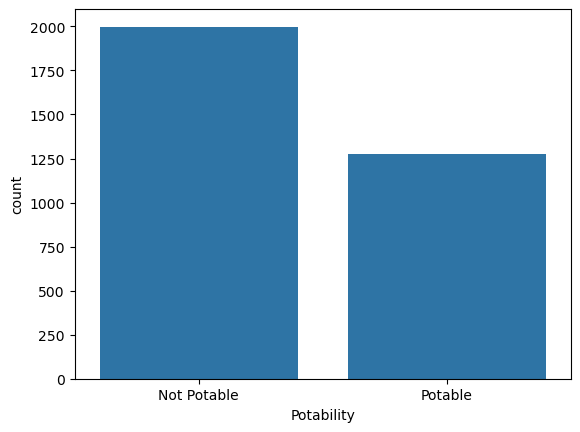

In [20]:
ax = sns.countplot(x="Potability", data=df, saturation=0.8)
plt.xticks(ticks=[0, 1], labels = ["Not Potable", "Potable"])
plt.show()

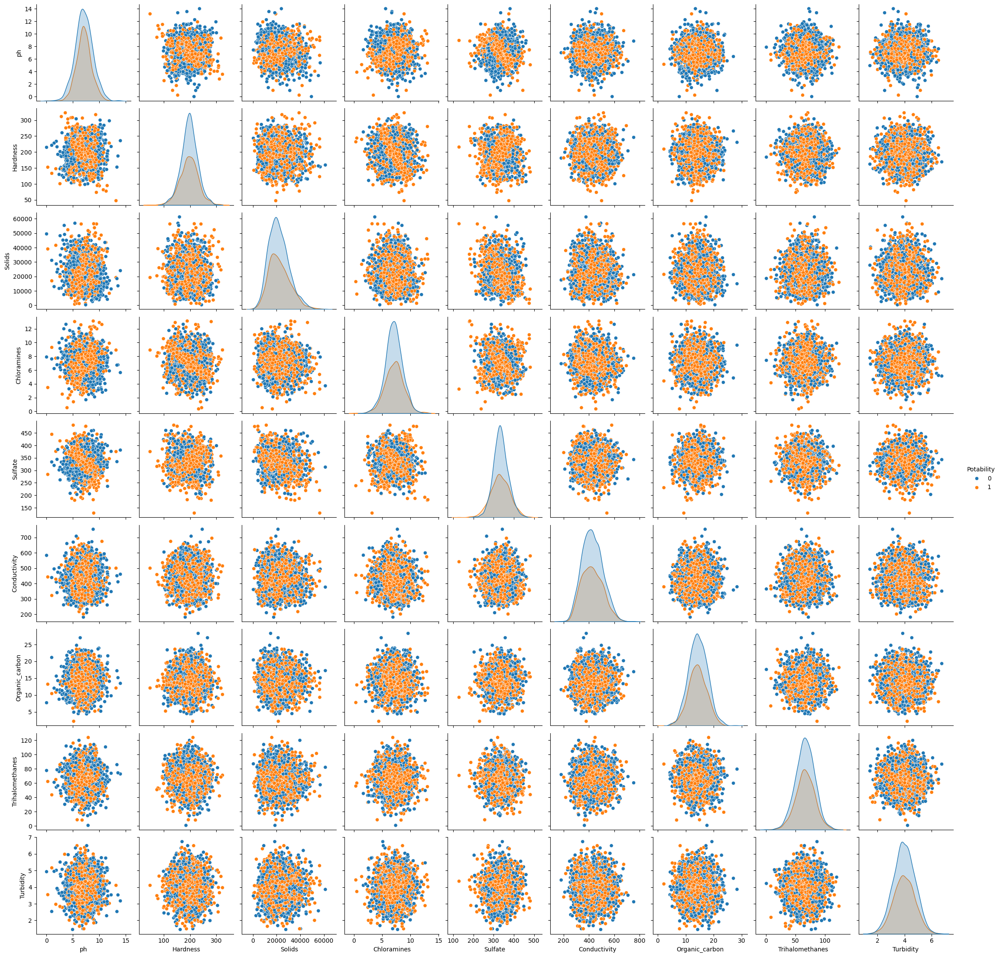

In [21]:
sns.pairplot(df, hue="Potability")

<Axes: xlabel='Potability', ylabel='Density'>

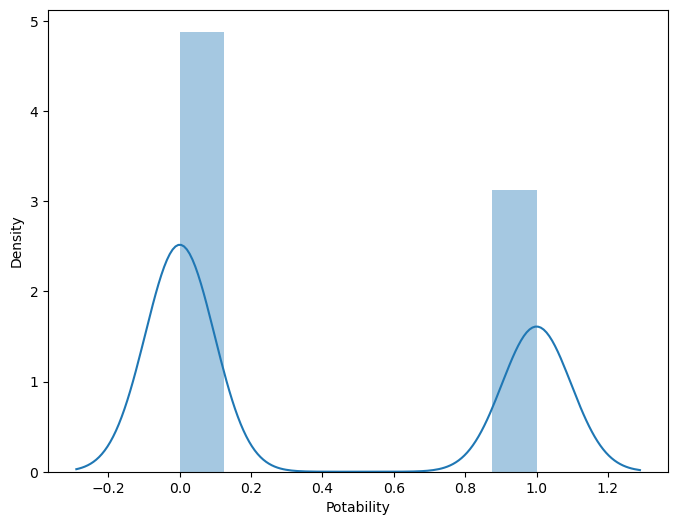

In [22]:
plt.rcParams['figure.figsize'] = [8,6]
sns.distplot(df['Potability'])

## Independent Variable Analysis 

In [24]:
df.corr()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.082096,-0.089288,-0.034350,0.018203,0.018614,0.043503,0.003354,-0.039057,-0.003556
Hardness,0.082096,1.000000,-0.046899,-0.030054,-0.106923,-0.023915,0.003610,-0.013013,-0.014449,-0.013837
Solids,-0.089288,-0.046899,1.000000,-0.070148,-0.171804,0.013831,0.010242,-0.009143,0.019546,0.033743
Chloramines,-0.034350,-0.030054,-0.070148,1.000000,0.027244,-0.020486,-0.012653,0.017084,0.002363,0.023779
Sulfate,0.018203,-0.106923,-0.171804,0.027244,1.000000,-0.016121,0.030831,-0.030274,-0.011187,-0.023577
Conductivity,0.018614,-0.023915,0.013831,-0.020486,-0.016121,1.000000,0.020966,0.001285,0.005798,-0.008128
Organic_carbon,0.043503,0.003610,0.010242,-0.012653,0.030831,0.020966,1.000000,-0.013274,-0.027308,-0.030001
Trihalomethanes,0.003354,-0.013013,-0.009143,0.017084,-0.030274,0.001285,-0.013274,1.000000,-0.022145,0.007130
Turbidity,-0.039057,-0.014449,0.019546,0.002363,-0.011187,0.005798,-0.027308,-0.022145,1.000000,0.001581
Potability,-0.003556,-0.013837,0.033743,0.023779,-0.023577,-0.008128,-0.030001,0.007130,0.001581,1.000000


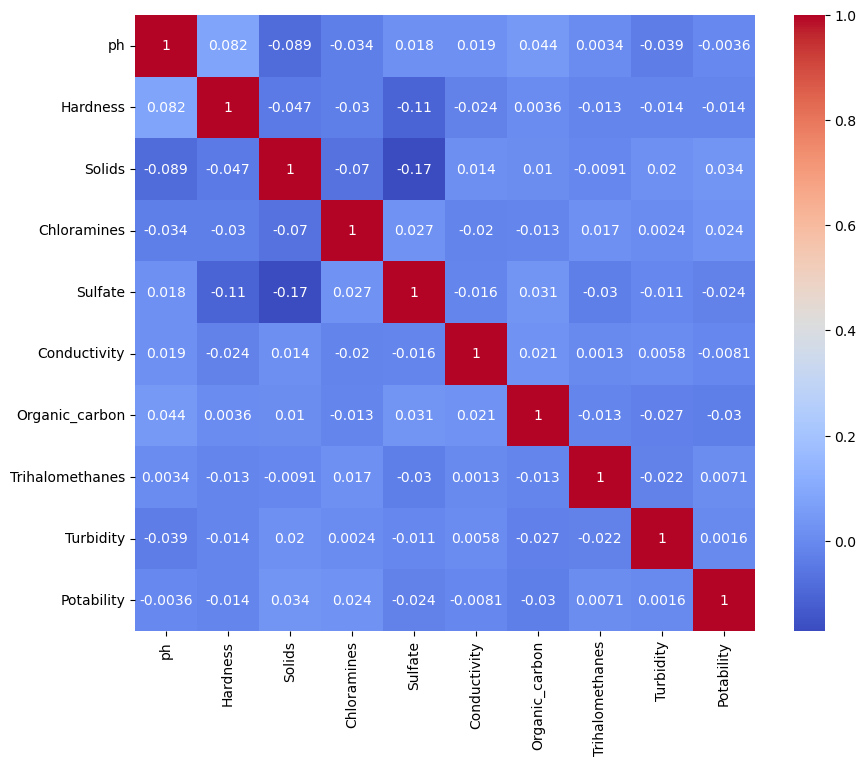

In [25]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.show()

In [26]:
### looking at higher values
corr = df.corr()
val = corr.abs().unstack()
val.sort_values(ascending=False)[12:24:2]

Hardness  Sulfate           0.106923
ph        Solids            0.089288
Hardness  ph                0.082096
Solids    Chloramines       0.070148
Hardness  Solids            0.046899
ph        Organic_carbon    0.043503
dtype: float64

## Distribution of Features

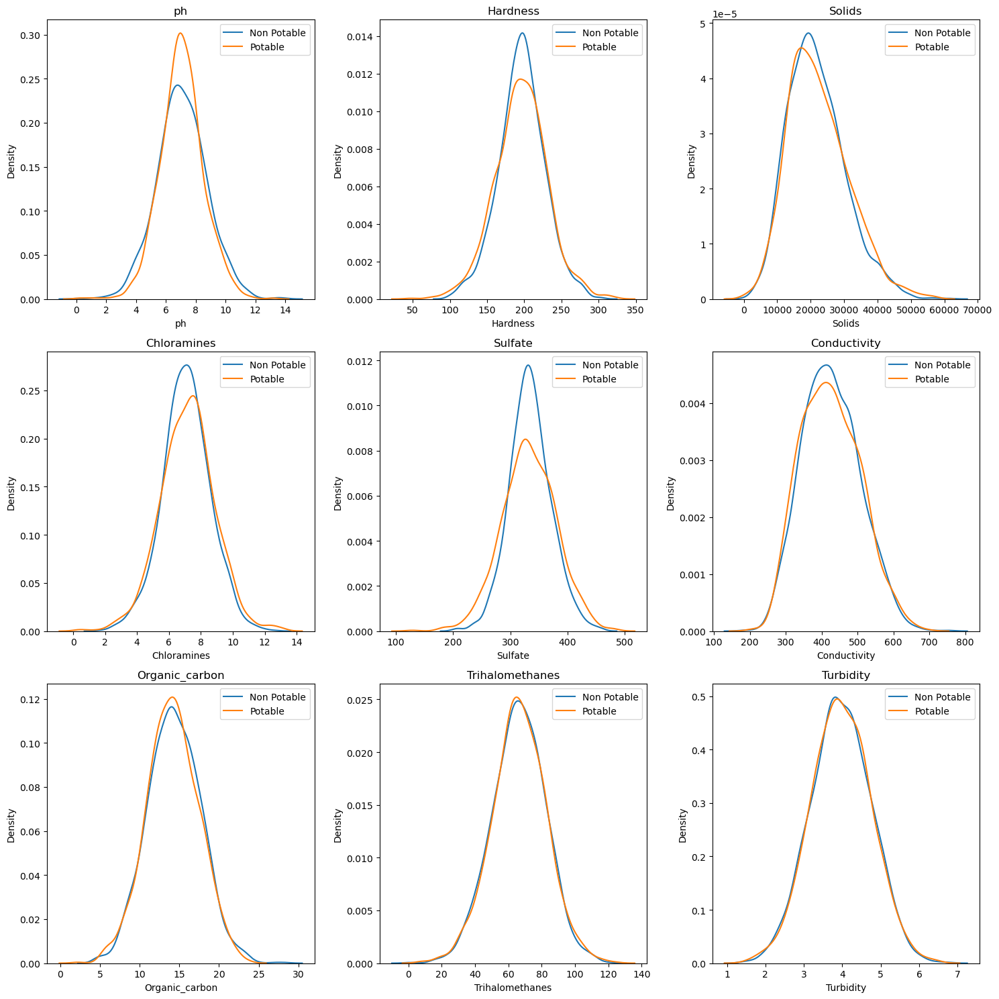

In [28]:
non_potable = df.query("Potability == 0")
potable = df.query("Potability == 1")

plt.figure(figsize = (15,15))
for ax, col in enumerate(df.columns[:9]):
    plt.subplot(3,3, ax + 1)
    plt.title(col)
    sns.kdeplot(x = non_potable[col], label = "Non Potable")
    sns.kdeplot(x = potable[col], label = "Potable")
    plt.legend()
plt.tight_layout()

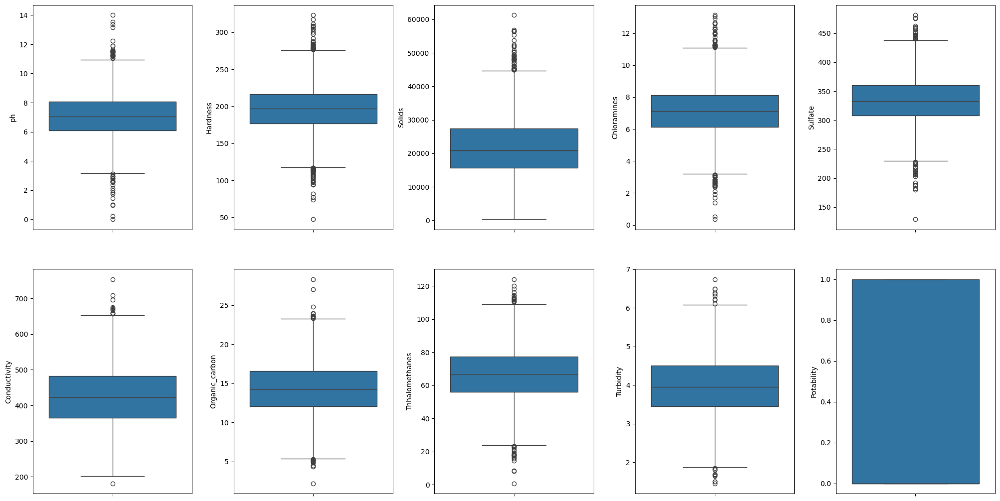

In [29]:
### Visualizing data and outliers
fig, ax = plt.subplots(ncols = 5, nrows = 2, figsize = (20, 10))
index = 0
ax = ax.flatten()

for col, value in df.items():
    sns.boxplot(y=col, data=df, ax=ax[index])
    index += 1
plt.tight_layout(pad = 0.5, w_pad=0.7, h_pad=5.0)

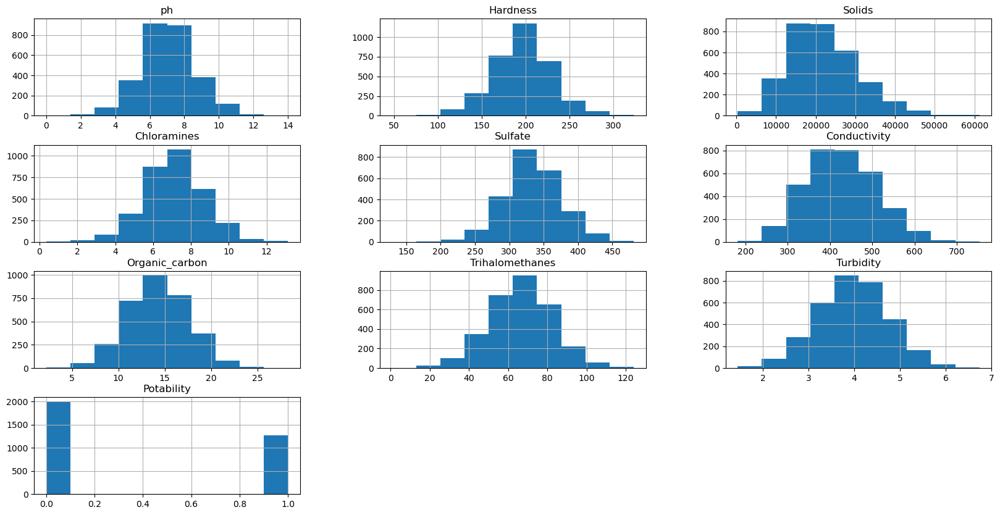

In [30]:
plt.rcParams['figure.figsize'] = [20,10]
df.hist()
plt.show()

In [31]:
##  Check the correlation using skew function. skew_val > abs(0.5) is considered skewed
skew_val = df.skew().sort_values(ascending=False)
skew_val

Solids             0.621634
Potability         0.450784
Conductivity       0.264490
ph                 0.025630
Organic_carbon     0.025533
Turbidity         -0.007817
Chloramines       -0.012098
Sulfate           -0.035947
Hardness          -0.039342
Trihalomethanes   -0.083031
dtype: float64

## Preprocessing: Missing Value Problem

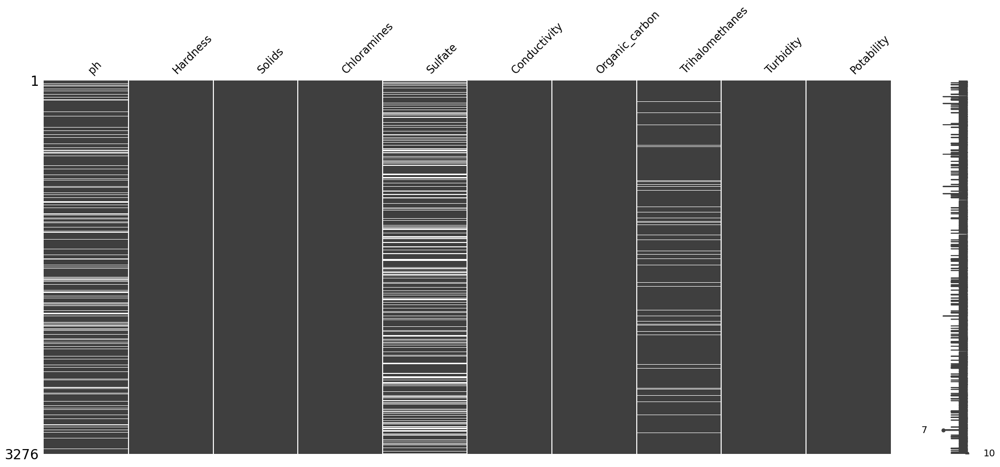

In [33]:
msno.matrix(df)
plt.show()

In [34]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

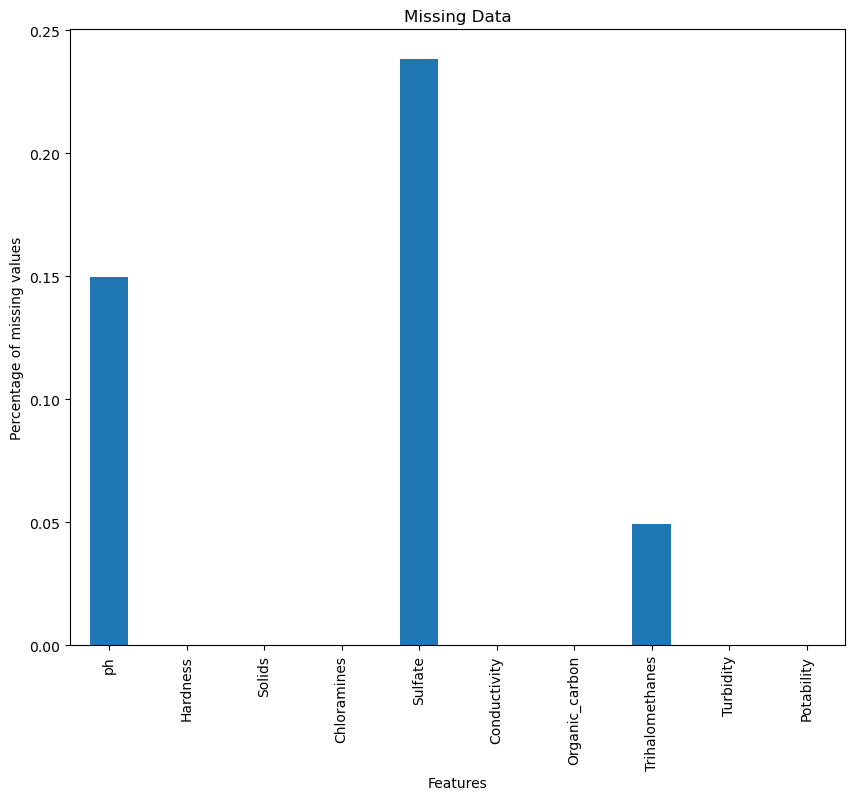

In [35]:
df.isnull().mean().plot.bar(figsize=(10,8)) 
plt.ylabel('Percentage of missing values') 
plt.xlabel('Features') 
plt.title('Missing Data');

In [36]:
# handle missing value with average of features
df["ph"] = df["ph"].fillna(value = df["ph"].mean())
df["Sulfate"] = df["Sulfate"].fillna(value = df["Sulfate"].mean())
df["Trihalomethanes"]= df["Trihalomethanes"].fillna(value = df["Trihalomethanes"].mean())

In [37]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

## Preprocessing: Train-Test Split and Normalization

In [39]:
X = df.drop("Potability", axis = 1)
y = df["Potability"]

In [40]:
X.shape, y.shape

((3276, 9), (3276,))

In [41]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
X

array([[-6.04313345e-16,  2.59194711e-01, -1.39470871e-01, ...,
        -1.18065057e+00,  1.30614943e+00, -1.28629758e+00],
       [-2.28933938e+00, -2.03641367e+00, -3.85986650e-01, ...,
         2.70597240e-01, -6.38479983e-01,  6.84217891e-01],
       [ 6.92867789e-01,  8.47664833e-01, -2.40047337e-01, ...,
         7.81116857e-01,  1.50940884e-03, -1.16736546e+00],
       ...,
       [ 1.59125368e+00, -6.26829230e-01,  1.27080989e+00, ...,
        -9.81329234e-01,  2.18748247e-01, -8.56006782e-01],
       [-1.32951593e+00,  1.04135450e+00, -1.14405809e+00, ...,
        -9.42063817e-01,  7.03468419e-01,  9.50797383e-01],
       [ 5.40150905e-01, -3.85462310e-02, -5.25811937e-01, ...,
         5.60940070e-01,  7.80223466e-01, -2.12445866e+00]])

In [42]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)
print("X_train",X_train.shape)
print("X_test",X_test.shape)
print("y_train",y_train.shape)
print("y_test",y_test.shape)

X_train (2293, 9)
X_test (983, 9)
y_train (2293,)
y_test (983,)


## Modelling: Logistic Regression

In [44]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [45]:
model_lr = LogisticRegression(max_iter=120, random_state=10, n_jobs=20)
model_lr.fit(X_train,y_train)

LogisticRegression(max_iter=120, n_jobs=20, random_state=10)

In [46]:
pred_lr=model_lr.predict(X_test)
lr = accuracy_score(y_test,pred_lr)
lr

0.6276703967446592

* Precision Score: The precision is the ratio tp / (tp + fp) where tp is the number of true positives and fp the number of false positives. The precision is intuitively the ability of the classifier not to label as positive a sample that is negative.

In [48]:
print(classification_report(y_test,pred_lr))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       615
           1       1.00      0.01      0.01       368

    accuracy                           0.63       983
   macro avg       0.81      0.50      0.39       983
weighted avg       0.77      0.63      0.49       983



<Axes: >

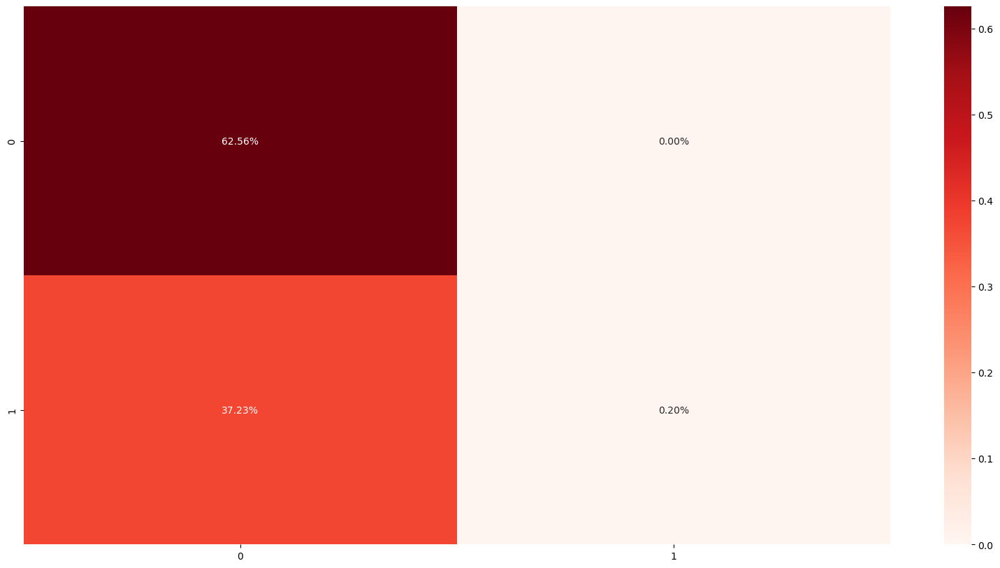

In [78]:
# confusion Maxtrix
cm_lr = confusion_matrix(y_test, pred_lr)
sns.heatmap(cm_lr/np.sum(cm_lr), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Modelling: Decision Tree

In [51]:
from sklearn.tree import DecisionTreeClassifier

In [148]:
depth = 4
model_dt = DecisionTreeClassifier(max_depth = depth, random_state=10)
model_dt.fit(X_train, y_train)
pred_dt = model_dt.predict(X_test)
dt = accuracy_score(y_test, pred_dt)
print('Decision tree Score', dt)

Decision tree Score 0.6561546286876907


In [74]:
print(classification_report(y_test,pred_dt))

              precision    recall  f1-score   support

           0       0.66      0.93      0.77       615
           1       0.64      0.19      0.29       368

    accuracy                           0.66       983
   macro avg       0.65      0.56      0.53       983
weighted avg       0.65      0.66      0.59       983



<Axes: >

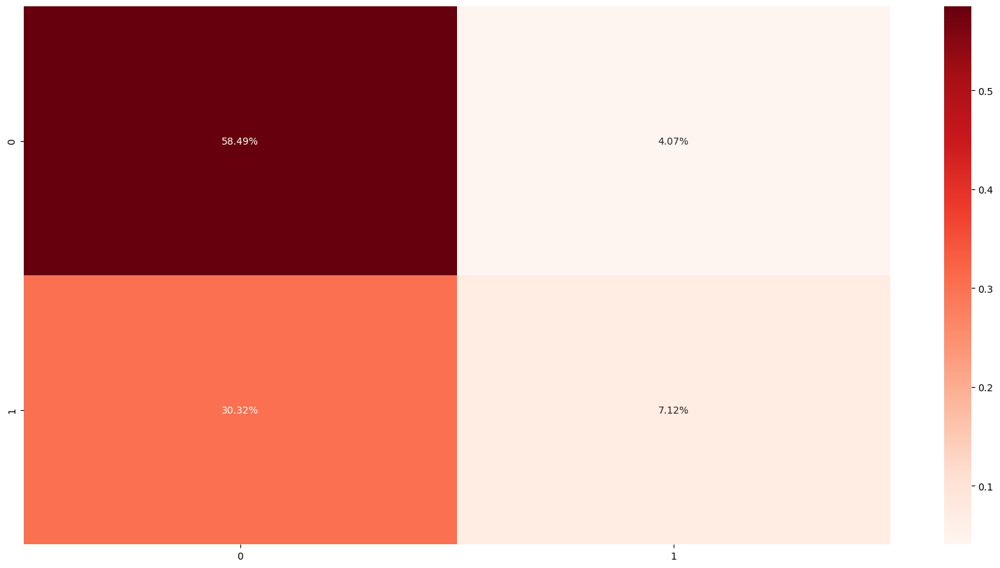

In [76]:
# confusion Maxtrix
cm_dt = confusion_matrix(y_test, pred_dt)
sns.heatmap(cm_dt/np.sum(cm_dt), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Modelling: Random Forest Classifier

In [70]:
from sklearn.ensemble import RandomForestClassifier

In [153]:
model_rf = RandomForestClassifier(n_estimators=300,min_samples_leaf=0.16, random_state=10)
model_rf.fit(X_train, y_train)
pred_rf = model_rf.predict(X_test)
rf = accuracy_score(y_test, pred_rf)
print('Random Forest Score', rf)

Random Forest Score 0.6256358087487284


In [88]:
print(classification_report(y_test,pred_rf))

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       615
           1       0.00      0.00      0.00       368

    accuracy                           0.63       983
   macro avg       0.31      0.50      0.38       983
weighted avg       0.39      0.63      0.48       983



<Axes: >

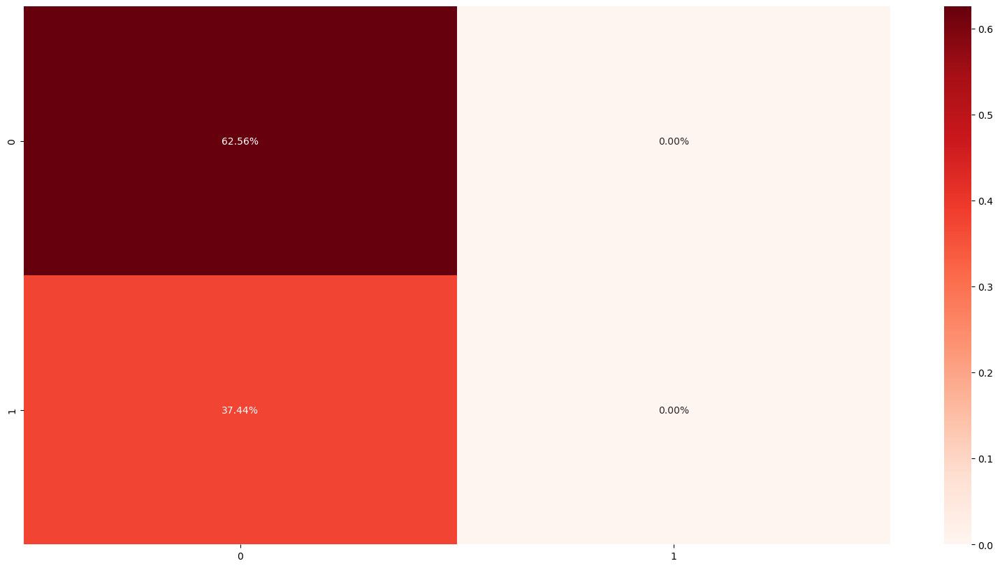

In [90]:
# confusion Maxtrix
cm_rf = confusion_matrix(y_test, pred_rf)
sns.heatmap(cm_rf/np.sum(cm_rf), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Modelling: XGBoost

In [97]:
from xgboost import XGBClassifier

In [101]:
model_xgb = XGBClassifier(max_depth= 8, n_estimators= 125, random_state= 0,  learning_rate= 0.03, n_jobs=5)
model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=125, n_jobs=5,
              num_parallel_tree=None, random_state=0, ...)

In [105]:
pred_xgb = model_xgb.predict(X_test)
xgb = accuracy_score(y_test, pred_xgb)
xgb

0.6734486266531028

In [109]:
print(classification_report(y_test,pred_xgb))

              precision    recall  f1-score   support

           0       0.69      0.87      0.77       615
           1       0.61      0.35      0.45       368

    accuracy                           0.67       983
   macro avg       0.65      0.61      0.61       983
weighted avg       0.66      0.67      0.65       983



<Axes: >

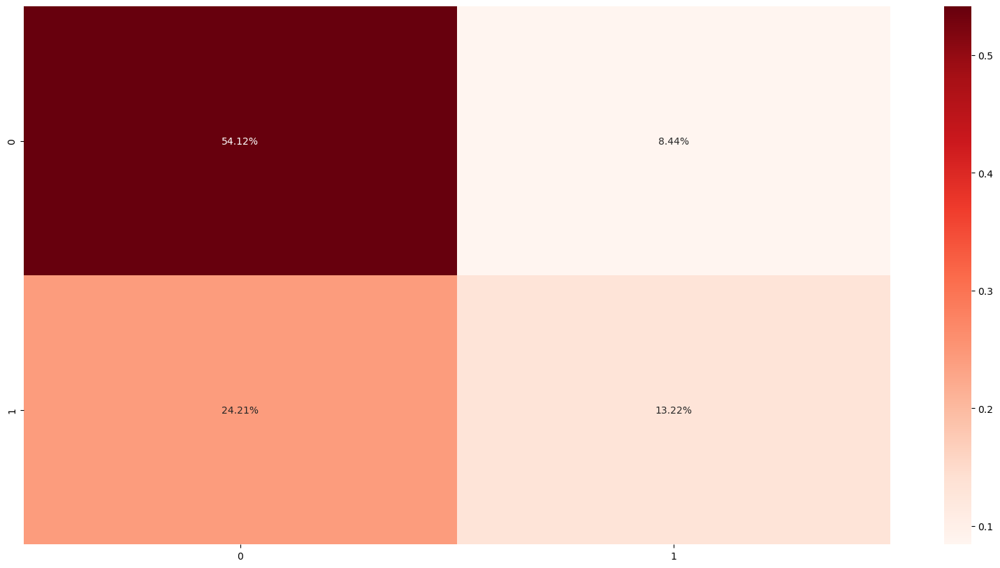

In [111]:
cm_xgb = confusion_matrix(y_test, pred_xgb)
sns.heatmap(cm_xgb/np.sum(cm_xgb), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Modelling: KNeighbours

In [114]:
from sklearn.neighbors import KNeighborsClassifier

In [117]:
model_kn = KNeighborsClassifier(n_neighbors=9, leaf_size=20)
model_kn.fit(X_train, y_train)
KNeighborsClassifier(leaf_size=20, n_neighbors=9)
pred_kn = model_kn.predict(X_test)
kn = accuracy_score(y_test, pred_kn)
kn

0.6500508646998983

In [119]:
print(classification_report(y_test,pred_kn))

              precision    recall  f1-score   support

           0       0.68      0.82      0.75       615
           1       0.55      0.36      0.43       368

    accuracy                           0.65       983
   macro avg       0.62      0.59      0.59       983
weighted avg       0.63      0.65      0.63       983



<Axes: >

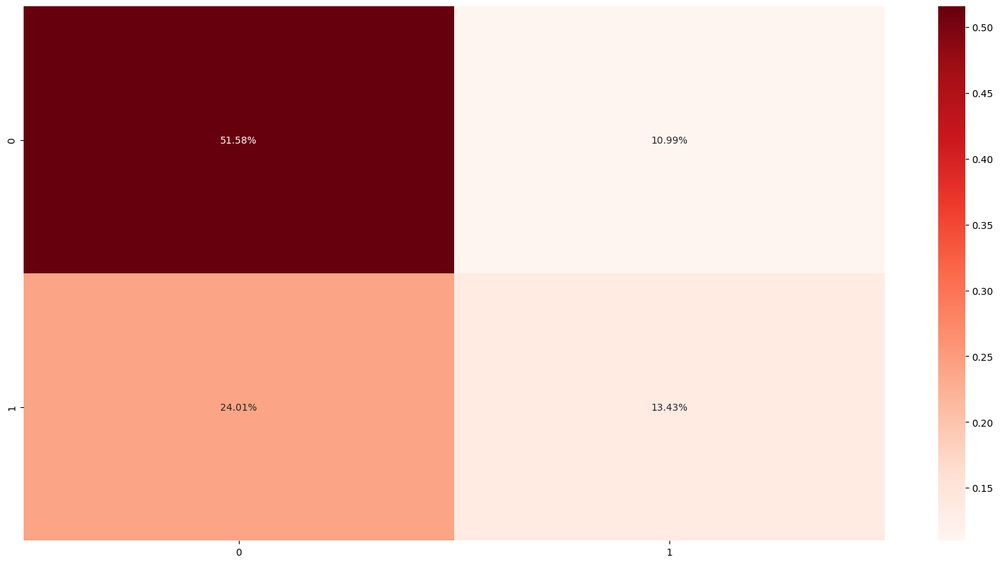

In [121]:
cm_kn = confusion_matrix(y_test, pred_kn)
sns.heatmap(cm_kn/np.sum(cm_kn), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Modelling: SVN

In [124]:
from sklearn.svm import SVC, LinearSVC

In [126]:
model_svm = SVC(kernel='rbf', random_state = 10)
model_svm.fit(X_train, y_train)
SVC(random_state=10)
pred_svm = model_svm.predict(X_test)
sv = accuracy_score(y_test, pred_svm)
sv

0.6805696846388606

In [128]:
print(classification_report(y_test,pred_kn))

              precision    recall  f1-score   support

           0       0.68      0.82      0.75       615
           1       0.55      0.36      0.43       368

    accuracy                           0.65       983
   macro avg       0.62      0.59      0.59       983
weighted avg       0.63      0.65      0.63       983



<Axes: >

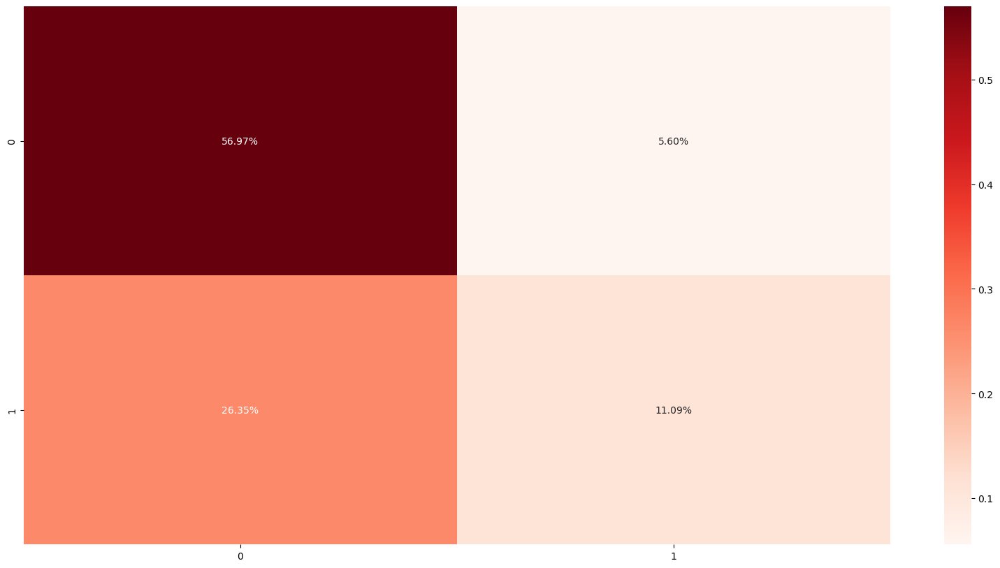

In [130]:
cm_svn = confusion_matrix(y_test, pred_svm)
sns.heatmap(cm_svn/np.sum(cm_svn), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Modelling: AdaBoost 

In [133]:
from sklearn.ensemble import AdaBoostClassifier

In [137]:
model_ada = AdaBoostClassifier(learning_rate= 0.002,n_estimators= 205,random_state=10)
model_ada.fit(X_train, y_train)
pred_ada = model_ada.predict(X_test)
ada = accuracy_score(y_test, pred_ada)
ada

0.6185147507629705

In [139]:
print(classification_report(y_test,pred_ada))

              precision    recall  f1-score   support

           0       0.63      0.92      0.75       615
           1       0.46      0.11      0.18       368

    accuracy                           0.62       983
   macro avg       0.55      0.52      0.47       983
weighted avg       0.57      0.62      0.54       983



<Axes: >

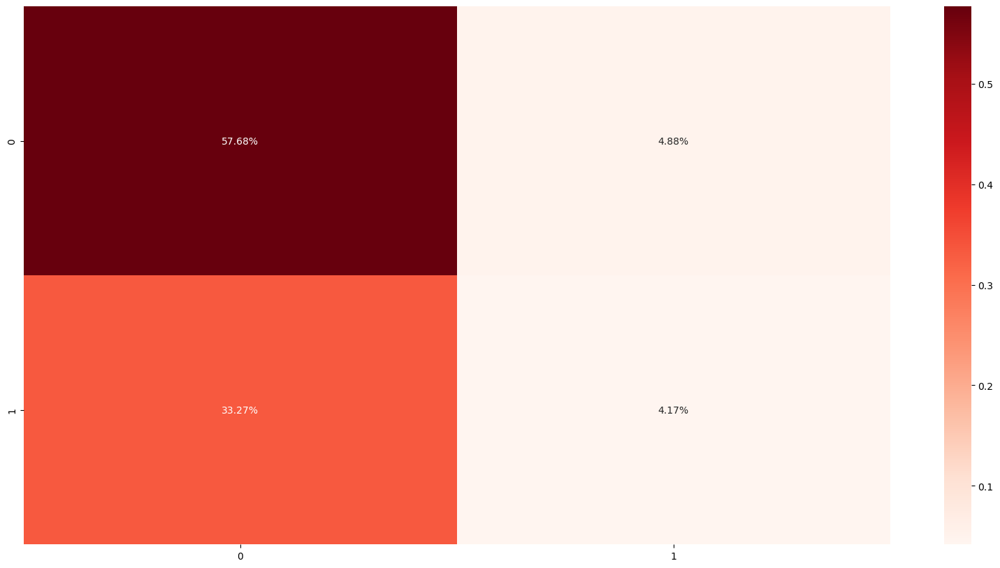

In [141]:
cm_ada = confusion_matrix(y_test, pred_ada)
sns.heatmap(cm_ada/np.sum(cm_ada), annot = True, fmt=  '0.2%', cmap = 'Reds')

## Results summary

,Model,Accuracy_score
5,SVM,0.680570
3,XGBoost,0.673449
1,Decision Tree,0.656155
4,KNeighbours,0.650051
0,Logistic Regression,0.627670
2,Random Forest,0.625636
6,AdaBoost,0.618515


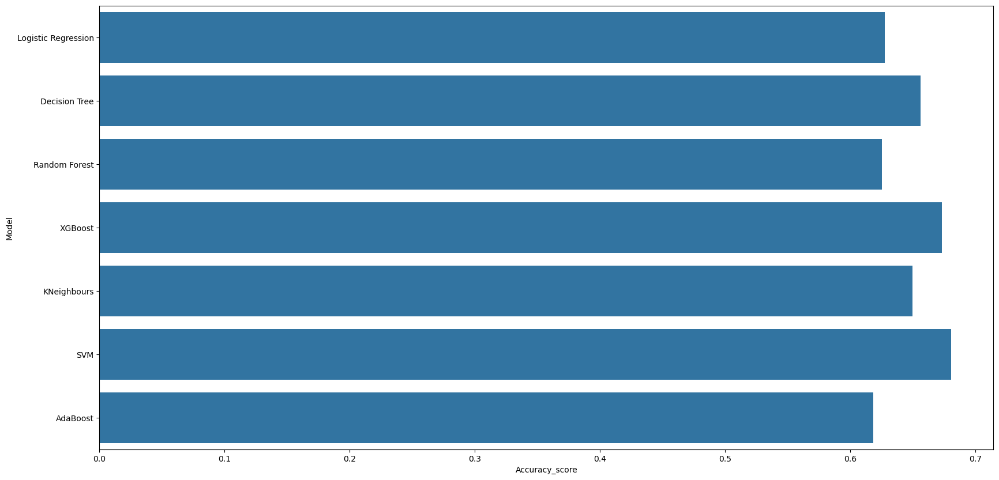

In [155]:
models = pd.DataFrame({
    'Model':['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'KNeighbours', 'SVM', 'AdaBoost'],
    'Accuracy_score' :[lr, dt, rf, xgb, kn, sv, ada]
})
models
sns.barplot(x='Accuracy_score', y='Model', data=models)

models.sort_values(by='Accuracy_score', ascending=False)